# Train a TensorFlow-lite model for identifying plant species

## Table of Contents
* [Introduction](#Introduction)
* [Get the data for analysis](#Get-the-data-for-analysis)
* [Train the model](#Train-the-model)
    * [Necessary imports](#Necessary-imports)
    * [Prepare data](#Prepare-data)
    * [Visualize a few samples from your training data](#Visualize-a-few-samples-from-your-training-data)
    * [Load model architecture](#Load-model-architecture)
    * [Find an optimal learning rate](#Find-an-optimal-learning-rate)
    * [Fit the model](#Fit-the-model)
    * [Visualize results in validation set](#Visualize-results-in-validation-set)
    * [Save the model](#Save-the-model)
* [Deploy model](#Deploy-model)

## Introduction

This notebook intends to showcase the ArcGIS API for Python's capablity to train a deep learning model that can be used in mobile applications for a real time inferencing using Tensorflow Lite framework.
As an example to showcase, a model is trained using this capability to classify different species of plants in this notebook.

## Get the data for analysis

There are three training packages that are available:

 - <b>eol</b>: a "trusted" training set based on the online collaborative Encyclopedia Of Life (EOL). About 2,60000 images related to 10,000 species. All images are under CreativeCommons licence.
   http://otmedia.lirmm.fr/LifeCLEF/PlantCLEF2017/TrainPackages/PlantCLEF2017Train1EOL.tar.gz

 - <b>web</b>: a "noisy" training set built through Microsoft Bing image search engine. About 1,440,000 images related to the same 10, 000 species. Note that the dataset may contain a non negligible number of duplicate images.
   http://otmedia.lirmm.fr/LifeCLEF/PlantCLEF2017/TrainPackages/PlantCLEF2017Train2Web.tar.gz

 - the PlantCLEF datasets from the two previous editions can be also used. Up to 1,00,000 resuable images related to 880 species. The file "classid_lifec
lef2016_to_classid2017.csv" gives the mapping between the class ids used last year with the class ids used this year.
   http://otmedia.lirmm.fr/LifeCLEF/PlantCLEF2015/Packages/TrainingPackage/PlantCLEF2015TrainingData.tar.gz
   http://otmedia.lirmm.fr/LifeCLEF/PlantCLEF2015/Packages/TestPackage/PlantCLEF2015TestDataWithAnnotations.tar.gz
   http://otmedia.lirmm.fr/LifeCLEF/PlantCLEF2016/PlantCLEF2016Test.tar.gz
   http://otmedia.lirmm.fr/LifeCLEF/PlantCLEF2016/RunFilesToolAndResults.zip

For this notebook, we have used PlantCLEF data with eol license with 2,60,000 images related to 10,000 species. You can click on the first link to download the dataset.

## Train the model 

We will train our model using `arcgis.learn` module within ArcGIS API for Python. `arcgis.learn` contains tools and deep learning capabilities required for this study. A detailed documentation to install and setup the environment is available [here](https://developers.arcgis.com/python/guide/install-and-set-up/).

### Necessary imports

Firstly, we need to set the environment variable for ArcGIS to enable Tensorflow as backend. To perform this, we can set `ARCGIS_ENABLE_TF_BACKEND` parameter's value to 1 as shown below.

In [1]:
%env ARCGIS_ENABLE_TF_BACKEND=1

env: ARCGIS_ENABLE_TF_BACKEND=1


In [4]:
from arcgis.learn import prepare_data, FeatureClassifier

### Prepare data

We will now use the `prepare_data()` function to apply various types of transformations and augmentations on the training data. These augmentations enable us to train a better model with limited data and also prevent the model from overfitting. 

`prepare_data()` takes 3 parameters.
 - `path`: path of folder containing training data.
 - `chip_size`: Same as per specified while exporting training data.
 - `batch_size`: No of images your model will train on each step inside an epoch, it directly depends on the memory of your graphic card and the type of model which you are working with. For this sample a batch size of 64 worked for us on a GPU with 11GB memory.

In [6]:
data = prepare_data(
    path='to_train',
    dataset_type='Imagenet',
    batch_size=8,
    chip_size=300
)

### Visualize a few samples from your training data

To make sense of training data we will use the `show_batch()` method in arcgis.learn. `show_batch()` randomly picks few samples from the training data and visualizes them.

 - `rows`: No of rows we want to see the results for.

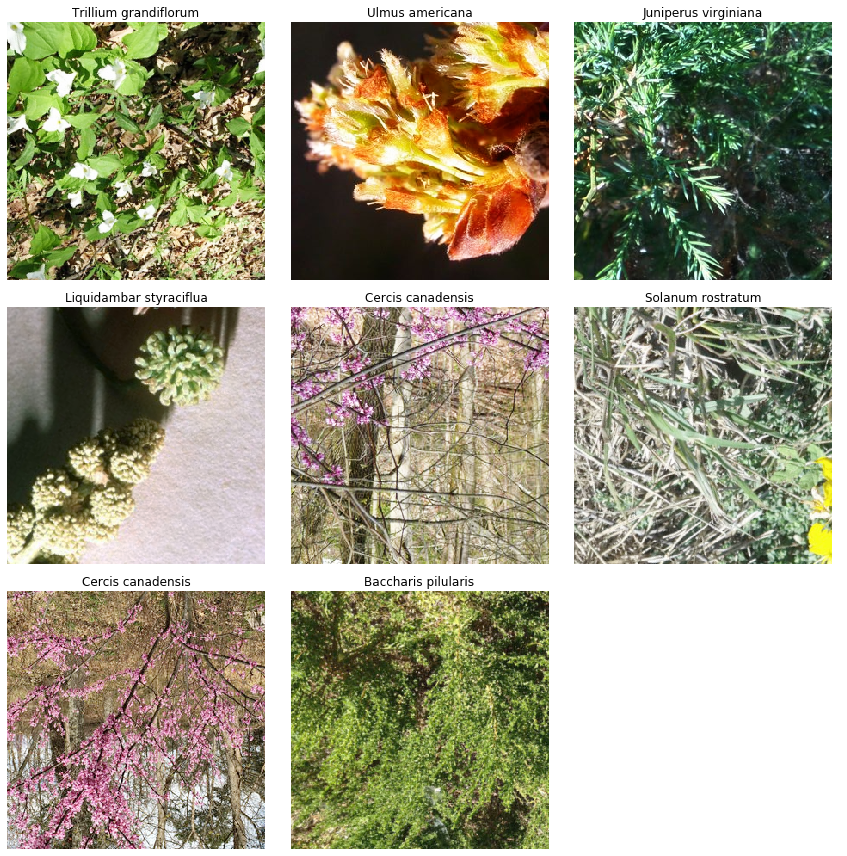

In [8]:
data.show_batch(rows=5)

### Load model architecture

In [ ]:
model = FeatureClassifier(data, backbone='MobileNetV2', backend='tensorflow', fpn=False)

### Find an optimal learning rate

Learning rate is one of the most important hyperparameters in model training. Here, we explore a range of learning rate to guide us to choose the best one. `arcgis.learn` leverages fast.ai’s learning rate finder to find an optimum learning rate for training models. We can use the `lr_find()` method to find the optimum learning rate at which can train a robust model fast enough.

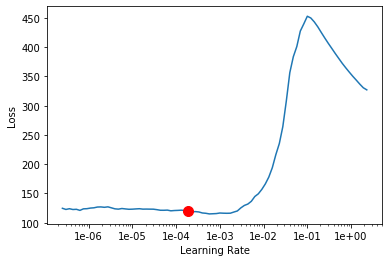

0.00019054607

In [10]:
model.lr_find()

Based on the learning rate plot above, we can see that the learning rate suggested by `lr_find()` for our training data is 1e-03. We can use it to train our model. In the latest release of arcgis.learn we can train models without even specifying a learning rate. That internally uses the learning rate finder to find an optimal learning rate and uses it.

### Fit the model 

To train the model, we use the `fit()` method. To start, we will use 10 epochs to train our model. Epoch defines how many times model is exposed to entire training set.

In [8]:
model.fit(10, 9.120109e-05)

epoch,train_loss,valid_loss,time
0,284.865234,285.662079,08:18
1,248.108414,249.561539,08:15
2,208.218201,208.497070,08:14
3,180.523041,180.049423,08:20
4,160.003830,160.663971,08:20
5,145.964081,147.054871,08:19
6,138.888016,139.591797,08:19
7,132.955963,134.115952,08:20
8,131.901047,132.734741,08:19
9,128.989700,130.424698,08:12


Instructions for updating:
Use tf.identity instead.


### Visualize results in validation set 

The code below will pick a few random samples and show us ground truth and respective model predictions side by side. This allows us to validate the results of your model in the notebook itself. Once satisfied, we can save the model and use it further in our workflow.

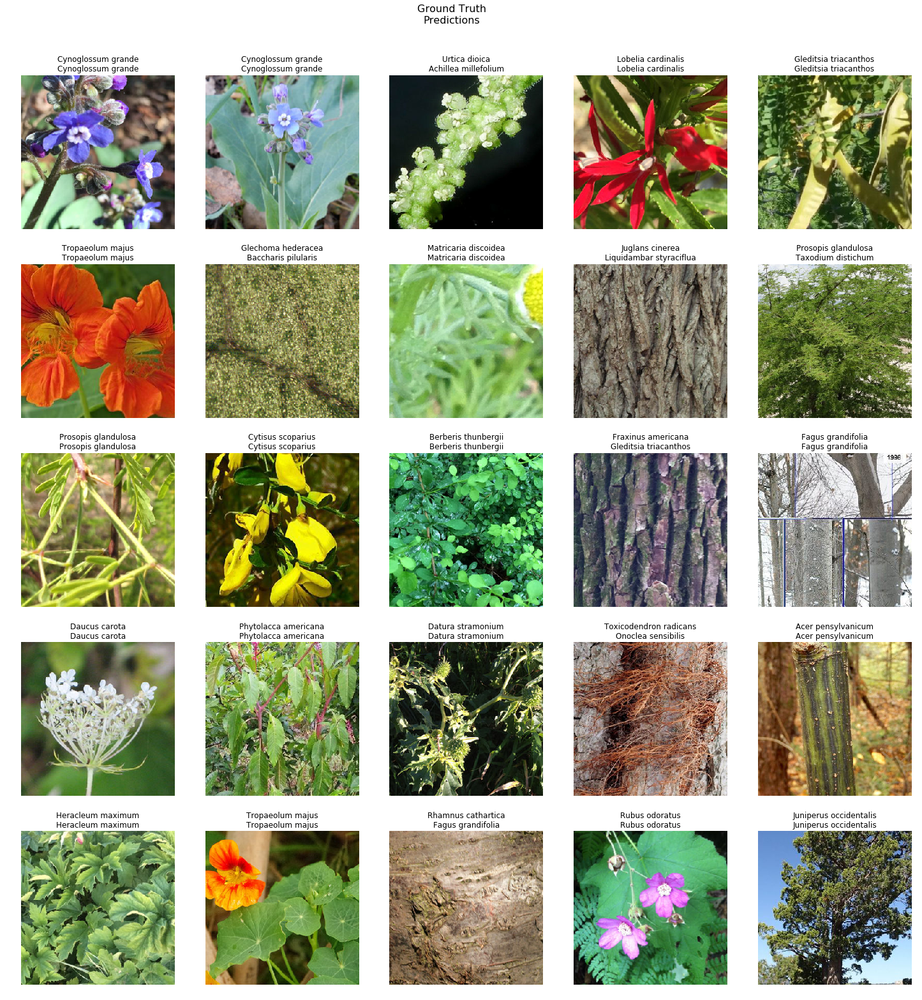

In [13]:
model.show_results(rows=8, thresh=0.2)

Here a subset of ground truth from training data is visualized along with the predictions from the model. As we can see, our model is performing well and the predictions are comparable to the ground truth.

### Save the model

We will save the model which we trained in a tflite format.

We will use the `save()` method to save the trained model. By default, it will be saved to the 'models' sub-folder within our training data folder.

In [ ]:
model.save('10e_tflite', framework="tflite")

Let's train it further to get better results. We will now fit the model for 40 more epochs.

In [12]:
model.fit(40)

epoch,train_loss,valid_loss,time
0,129.630768,129.968430,08:06
1,130.521011,131.060654,08:10
2,128.941345,130.015381,08:20
3,127.009377,127.625893,08:27
4,124.923622,125.655136,08:21
5,120.612679,120.697388,08:26
6,118.123833,118.298920,08:27
7,112.483269,113.049019,08:25
8,106.344551,106.835236,08:21
9,104.721169,104.989548,08:23


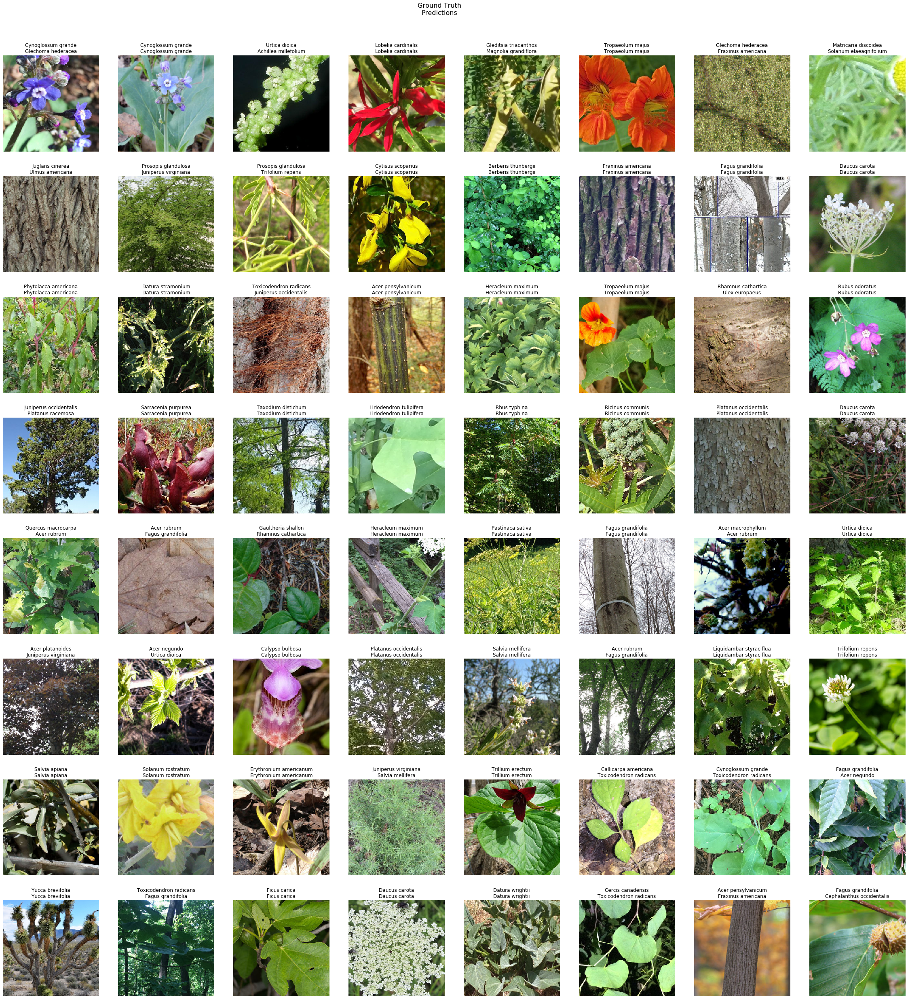

In [13]:
model.show_results(rows=8, thresh=0.2)

As you can see, the results have improved a lot after training for mre epochs. We can now save the present model with 50 epochs to be deployed on mobile devices.

In [ ]:
model.save('50e_tflite', framework="tflite")

### Deploy model

The tf-lite model can now be deployed on mobile devices. Survey123 for ArcGIS has an upcoming feature that integrates such tf-lite models. To learn more on deploying this model in Survey123, join the [Early Adopter Community](https://www.esri.com/en-us/early-adopter) to access the Survey123 private beta.